<a href="https://colab.research.google.com/github/nhwhite212/DealingwithDataSpring2021/blob/colab/8-Visualization/D_Creating_Map_Visualizations_Folium.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Visualization using maps in Python


Another perfect tool for vizualisation data processed in Python is `folium`. It builds on the data wrangling strengths of the Python ecosystem and the mapping strengths of the Leaflet.js library. It manipulate your data in Python, then visualize it in on a Leaflet map. It enables both the binding of data to a map for choropleth visualizations as well as passing Vincent/Vega visualizations as markers on the map.

In [1]:
!apt-get install -qq curl g++ make

In [2]:
#!curl -L http://download.osgeo.org/libspatialindex/spatialindex-src-1.8.5.tar.gz| tar xz
!apt-get update && apt-get -y install libspatialindex-dev

Hit:1 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:5 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:6 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:7 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Ign:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:9 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B]
Hit:11 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:12 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_6

In [4]:
!pip install rtree


In [5]:
!sudo pip install -U folium
!sudo pip install -U geopandas


     |████████████████████████████████| 102kB 5.3MB/s 
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.12.1 which is incompatible.
  Found existing installation: folium 0.8.3
    Uninstalling folium-0.8.3:
      Successfully uninstalled folium-0.8.3
     |████████████████████████████████| 972kB 12.9MB/s 
     |████████████████████████████████| 6.5MB 23.6MB/s 
     |████████████████████████████████| 14.8MB 270kB/s 


`folium` provides very detailed map and we may use it to visualize geodata localized in a small scale. Let's get the data from the [Citibike API](http://www.citibikenyc.com/stations/json):

In [7]:
import requests
import pandas as pd

#url = 'http://www.citibikenyc.com/stations/json'
# this is the new url for the  api
url='http://gbfs.citibikenyc.com/gbfs/en/station_status.json'
results = requests.get(url).json()

data=results['data']
print(data)
# data is a dictionary with one element, stations, which in turn is a list of dictionaries for each station.
citibike = pd.DataFrame(data['stations'])
#print(citibike)
#citibike.set_index('station_id', inplace=True)
# lets just keep what we need
citibike=citibike[['station_id','num_docks_available','num_bikes_available','station_status','last_reported']]
print(citibike)

{'stations': [{'num_docks_available': 45, 'num_ebikes_available': 1, 'legacy_id': '72', 'num_bikes_available': 10, 'is_renting': 1, 'is_returning': 1, 'station_id': '72', 'is_installed': 1, 'num_bikes_disabled': 0, 'station_status': 'active', 'last_reported': 1611154664, 'num_docks_disabled': 0, 'eightd_has_available_keys': False}, {'num_docks_available': 2, 'num_ebikes_available': 4, 'legacy_id': '79', 'num_bikes_available': 31, 'is_renting': 1, 'is_returning': 1, 'station_id': '79', 'is_installed': 1, 'num_bikes_disabled': 0, 'station_status': 'active', 'last_reported': 1611155297, 'num_docks_disabled': 0, 'eightd_has_available_keys': False}, {'num_docks_available': 19, 'num_ebikes_available': 1, 'legacy_id': '82', 'num_bikes_available': 6, 'is_renting': 1, 'is_returning': 1, 'station_id': '82', 'is_installed': 1, 'num_bikes_disabled': 2, 'station_status': 'active', 'last_reported': 1611155717, 'num_docks_disabled': 0, 'eightd_has_available_keys': False}, {'num_docks_available': 25, 

#### Selecting tiles

The first step is to create a map. At the very basic level, we select the location, zoom level, and potentially the tiles (i.e., the style of the map) for the background. The default is 'OpenStreetMap', but often for visualizations we prefer other, more visually neutral styles. (See http://folium.readthedocs.io/en/latest/quickstart.html for more tile optionS)

In [8]:
import folium
fmap = folium.Map(location=[40.73, -74], zoom_start=13, tiles='OpenStreetMap')
fmap

In [10]:

import folium
fmap = folium.Map(location=[40.73, -74], zoom_start=13,  tiles='cartodbpositron')
fmap

In [11]:
# unfortunately the api has changed, and the latitude and longitude are in a different URL
# we need to go there to get the latitude amd longitude for each station.


In [12]:

url='http://gbfs.citibikenyc.com/gbfs/en/station_information.json'
results = requests.get(url).json()

data=results['data']
#print(data['stations'][0])
# data is a dictionary with one element, stations, which in turn is a list of dictionaries for each station.
stationinfo = pd.DataFrame(data['stations'][0:])
stationinfo=stationinfo[['station_id','lat','lon','name']]
print(stationinfo)
#citibike.set_index('station_id',inplace=True)
#stationinfo.set_index('station_id', inplace=True)
# this is inefficient, but I am just going to join the 2 columns we want to the original dataframe
newbikes=pd.concat([citibike,stationinfo], axis=1)
print(newbikes)
#citibike['lat']


     station_id        lat        lon                           name
0            72  40.767272 -73.993929               W 52 St & 11 Ave
1            79  40.719116 -74.006667       Franklin St & W Broadway
2            82  40.711174 -74.000165         St James Pl & Pearl St
3            83  40.683826 -73.976323  Atlantic Ave & Fort Greene Pl
4           116  40.741776 -74.001497                W 17 St & 8 Ave
...         ...        ...        ...                            ...
1282       4327  40.782465 -73.914527                 21 St & 21 Ave
1283       4328  40.840124 -73.939490    W 167 St & St. Nicholas Ave
1284       4329  40.765476 -73.918116                 35 St & 30 Ave
1285       4331  40.751555 -73.915026                 48 St & 37 Ave
1286       4332  40.827230 -73.917656          Morris Ave & E 163 St

[1287 rows x 4 columns]
     station_id  num_docks_available  ...        lon                           name
0            72                   45  ... -73.993929           

#### Adding Markers 

For every station, we are going to add a marker in the map:
* Using the longitude and latitude for the location 
* Modify the color of the marker to reflect the status of the station
* Modify the opacity to be the percentage of bikes in the station. 
* Modify the size of the circle to corresponds to the size of the station.

In [13]:




for name, row in newbikes.iterrows():
    print(row)
    totaldocks =row["num_bikes_available"] + row["num_docks_available"] 
    # Define the opacity of the marker to be proportional to the percentage of bikes in the station
    opacity = row["num_bikes_available"]/totaldocks if row["station_status"] == 'active' else 1.0
    # Make the color green for the working stations, red otherwise
    color = "green" if row["station_status"] == 'active' else "red"
    # The size of the marker is proportional to the number of docks
    
    size = row["num_docks_available"]/5 if row["station_status"] == 'active' else 5
    
    # We create a marker on the map and we add it to the map
    
    folium.CircleMarker(location=[row["lat"], row["lon"]], 
                        radius = size,
                        fill_opacity = opacity,
                        fill_color = color,
                       ).add_to(fmap)
    
fmap

Streaming output truncated to the last 5000 lines.
station_id                               3758
num_docks_available                        17
num_bikes_available                         2
station_status                         active
last_reported                      1611149104
station_id                               3758
lat                                    40.703
lon                                    -73.93
name                   George St & Wilson Ave
Name: 787, dtype: object
station_id                                  3759
num_docks_available                            2
num_bikes_available                           17
station_status                            active
last_reported                         1611152518
station_id                                  3759
lat                                      40.7054
lon                                     -73.9253
name                   Irving Ave & Jefferson St
Name: 788, dtype: object
station_id                                  

#### Adding popups to the markers

For each marker, we can also have a popup with text, html, or even other charts/visualizations. Here is an example of adding an HTML popup to each marker.

In [15]:
fmap = folium.Map(location=[40.73, -74], zoom_start=13,  tiles='cartodbpositron')

for name, row in newbikes.iterrows():
    totaldocs= row["num_bikes_available"] + row["num_docks_available"]
    # Define the opacity of the marker to be proportional to the percentage of bikes in the station
    opacity = row["num_bikes_available"]/ totaldocks if row["station_status"] == 'active' else 1.0
    # Make the color green for the working stations, red otherwise
    color = "green" if row["station_status"] == 'active' else "red"
    # The size of the marker is proportional to the number of docks
    size = totaldocks/5 if row["station_status"] == 'active' else 5
    
    # The code below defines a pop-up for each station with details such as 
    # the address, number of bikes, capacity, etc.
    html = "<p style='font-family:sans-serif;font-size:11px'>" + \
           "<strong>Address: </strong>" + row["name"] + \
           "<br><strong>Available Bikes: </strong>" + str(row["num_bikes_available"]) + \
            "<br><strong>Total Docks: </strong>" + str(totaldocks)
    iframe = folium.IFrame(html=html, width=200, height=60)
    popup = folium.Popup(iframe, max_width=200)
    # create a marker on the map and we add it to the map
    # If you click on a station, a popup will show you information about it
    folium.CircleMarker(location=[row["lat"], row["lon"]], 
                        radius = size,
                        popup = popup, 
                        fill_opacity = opacity,
                        fill_color = color,
                       ).add_to(fmap)
    
fmap

#### Using shapefiles 

# First create data directory
!mkdir data

In [16]:
!mkdir data

In [17]:
# Dataset from NYC Open Data: https://data.cityofnewyork.us/City-Government/Neighborhood-Tabulation-Areas/cpf4-rkhq
!curl 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON' -o data/nyc-neighborhoods.geojson

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 4370k    0 4370k    0     0  2856k      0 --:--:--  0:00:01 --:--:-- 2856k


### Download zipcode data for NYC neighborhoods as "shapefiles" (i.e. polygons of the lat and lon of each point)

In [18]:
# NYC Zipcodes
!curl 'https://data.cityofnewyork.us/download/i8iw-xf4u/application%2Fzip' -o 'data/ZIP_CODE_040114.zip'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   194    0   194    0     0    281      0 --:--:-- --:--:-- --:--:--   281


### Result is a list [ntacode,ntaname, ((Polygon points))]


In [19]:

import geopandas as gpd
# convert the geodataframe to a panda dataframe from the json file we just downloaded
nyc_neighborhoods = gpd.GeoDataFrame.from_file('data/nyc-neighborhoods.geojson')
# only keep the fields we need, note that geometry contains the polygon points
# which define each neighborhood
nyc_neighborhoods = nyc_neighborhoods[['ntacode', 'ntaname', 'geometry']]
# peek at the first 10
nyc_neighborhoods.head(10)

,ntacode,ntaname,geometry
0,BK88,Borough Park,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,Murray Hill,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,East Elmhurst,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,Erasmus,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,Hollis,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."
5,BK25,Homecrest,"MULTIPOLYGON (((-73.95859 40.61040, -73.95828 ..."
6,QN41,Fresh Meadows-Utopia,"MULTIPOLYGON (((-73.77758 40.73019, -73.77849 ..."
7,BX33,Longwood,"MULTIPOLYGON (((-73.89484 40.82625, -73.89487 ..."
8,BK43,Midwood,"MULTIPOLYGON (((-73.96015 40.62892, -73.95996 ..."
9,QN08,St. Albans,"MULTIPOLYGON (((-73.75205 40.70523, -73.75174 ..."


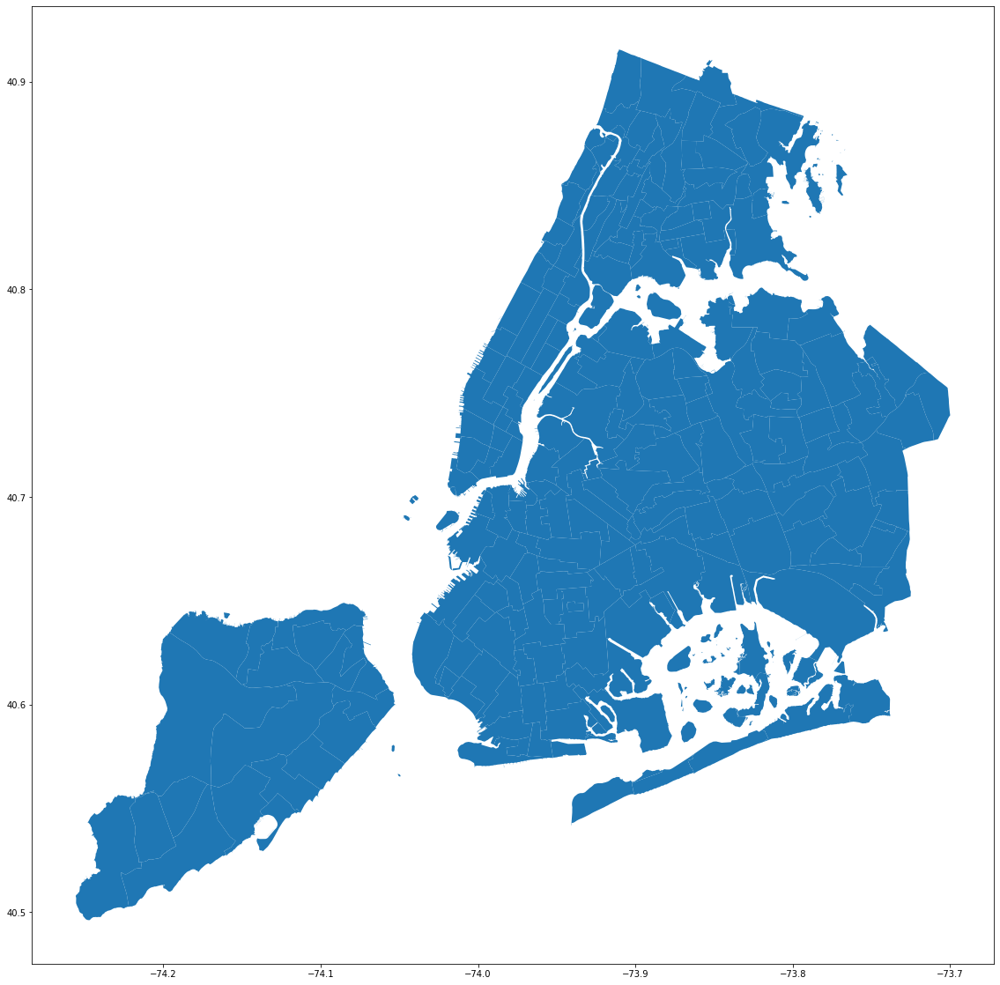

In [20]:
# plot the ploygons
nyc_neighborhoods.plot(figsize=(20,20))

### Now overlay the neighborhoods on a folium map of the country

In [22]:
import folium
fmap = folium.Map(location=[40.73, -74], zoom_start=11, tiles='cartodbpositron')

folium.GeoJson(nyc_neighborhoods,
               name='NYC Neighborhoods',
               style_function=lambda feature: {
                    'fillColor': '#c0fefe',
                    'color': 'black',
                    'weight': 0.5,
                    'fillOpacity': 0.25
                }
              ).add_to(fmap)

fmap

We first transform the Citibike Dataframe into a GeoPandas dataframe, by creating 
a column that contains Points, naming the column "geometry" and then 
setting the CRS (coordinate system) to be the same as the one for NYC neighborhoods

In [23]:
citibike=newbikes
from shapely.geometry import Point

citibike['geometry'] = citibike.apply(lambda row: Point(row['lon'], row['lat']), axis=1 )
citibike_gs = gpd.GeoDataFrame.from_records(citibike)


#### Spatial Join using GeoPandas

Now we join the `nyc_neighborhoods` dataframe that describes the NYC neighborhoods with the `citibike_gs` that has the locations of the Citibike stations.

In [24]:
!pip install rtree

#### It seems there may be some empty "points" in the dataframe.
lets clean it up

In [28]:
citibike_gs['geometry'].head()


#nyc_neighborhoods['geometry']

0      MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ...
1      MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ...
2      MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ...
3      MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ...
4      MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ...
                             ...                        
190    MULTIPOLYGON (((-73.86791 40.74493, -73.86788 ...
191    MULTIPOLYGON (((-73.89175 40.74681, -73.89139 ...
192    MULTIPOLYGON (((-74.09777 40.61062, -74.09730 ...
193    MULTIPOLYGON (((-74.06503 40.58899, -74.06503 ...
194    MULTIPOLYGON (((-74.11813 40.55059, -74.11656 ...
Name: geometry, Length: 195, dtype: geometry

In [29]:
citibike_gs.crs = nyc_neighborhoods.crs
stations_to_neighborhoods = gpd.sjoin(nyc_neighborhoods, citibike_gs, how="inner", op='intersects')
#stations_to_neighborhoods = gpd.sjoin( citibike_gs,nyc_neighborhoods,how="right")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: None

  


In [30]:
totaldock = pd.pivot_table(
    data = stations_to_neighborhoods, 
    index = 'ntacode',
    values = 'num_docks_available', 
    aggfunc = 'sum'
).drop(['MN99', 'BK99']) # drop the 'misc' areas

totaldock.head(5)

,num_docks_available
ntacode,
BK09,284
BK32,0
BK33,374
BK35,138
BK37,372


In [37]:
# GeoPandas choropleths / not very appealing visually
# 
nyc.set_index('ntacode').join(totaldocks, how='left').fillna(0).plot(   figsize=(20,20), column='totalDocks', cmap='OrRd', scheme='Quantiles', linewidth=0.1)

NameError: ignored

In [33]:
!head data/nyc-neighborhoods.geojson

{
  "type": "FeatureCollection",
  "features": [
    {"type":"Feature","properties":{"ntacode":"BK88","shape_area":"54005019.048","county_fips":"047","ntaname":"Borough Park","shape_leng":"39247.2278309","boro_name":"Brooklyn","boro_code":"3"},"geometry":{"type":"MultiPolygon","coordinates":[[[[-73.97604935657381,40.631275905646774],[-73.97716511994669,40.63074665412933],[-73.97699848928193,40.629871496125375],[-73.9768496430902,40.6290885814784],[-73.97669604371914,40.628354564208756],[-73.97657775689153,40.62757318681896],[-73.9765146210018,40.627294490493874],[-73.97644970441577,40.627008255472994],[-73.97623453682755,40.625976350730234],[-73.97726150032737,40.6258527728136],[-73.97719665645002,40.62510197855896],[-73.97710959292857,40.624948259691514],[-73.97694382374165,40.624052750014684],[-73.9768346520651,40.62348104194568],[-73.97675209645574,40.623013312325725],[-73.97656583927008,40.6219949031937],[-73.97695070814679,40.62163000717454],[-73.97705352864567,40.6215325218076],[

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [35]:
fmap = folium.Map(location=[40.73, -74], zoom_start=12, tiles='cartodbpositron')
# folium.LayerControl().add_to(fmap)

fmap.choropleth(geo_data='data/nyc-neighborhoods.geojson', 
                data=totaldock.reset_index(),
 #               columns=['ntacode', 'totalDocks'],
                columns=['ntacode','totaldocks'],     
                key_on='feature.properties.ntacode',
                fill_color='OrRd', 
                fill_opacity=0.5, 
                line_opacity=0.1,
                legend_name='Total Docks'
               )
#folium.LayerControl().add_to(fmap)
fmap

/usr/local/lib/python3.6/dist-packages/folium/folium.py:413: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


KeyError: ignored